In [212]:
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm


In [139]:
from PIL import Image
im = Image.open('Beta0_VV_db_2_5.tif')
im.show()
imarray = np.array(im)

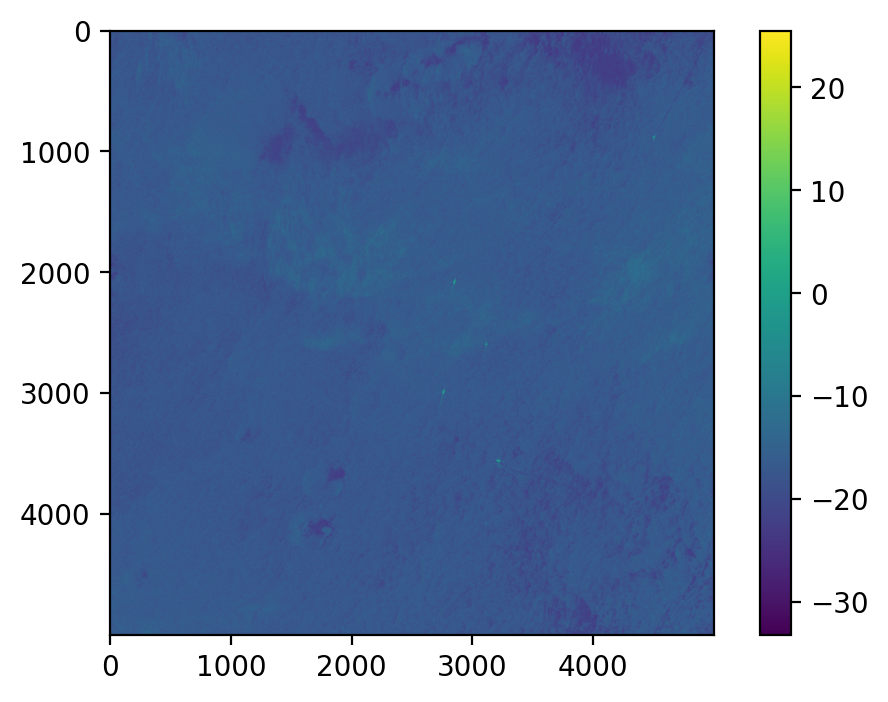

In [8]:
plt.figure(dpi = 200)
plt.imshow(imarray)
plt.colorbar()

In [27]:
data = imarray.ravel()

xlimit = 30.
n_bins = 150
bin_edges = np.linspace(xlimit*-1., xlimit, n_bins+1)

In [28]:
pdf, junk = np.histogram(data, bin_edges, density=True)

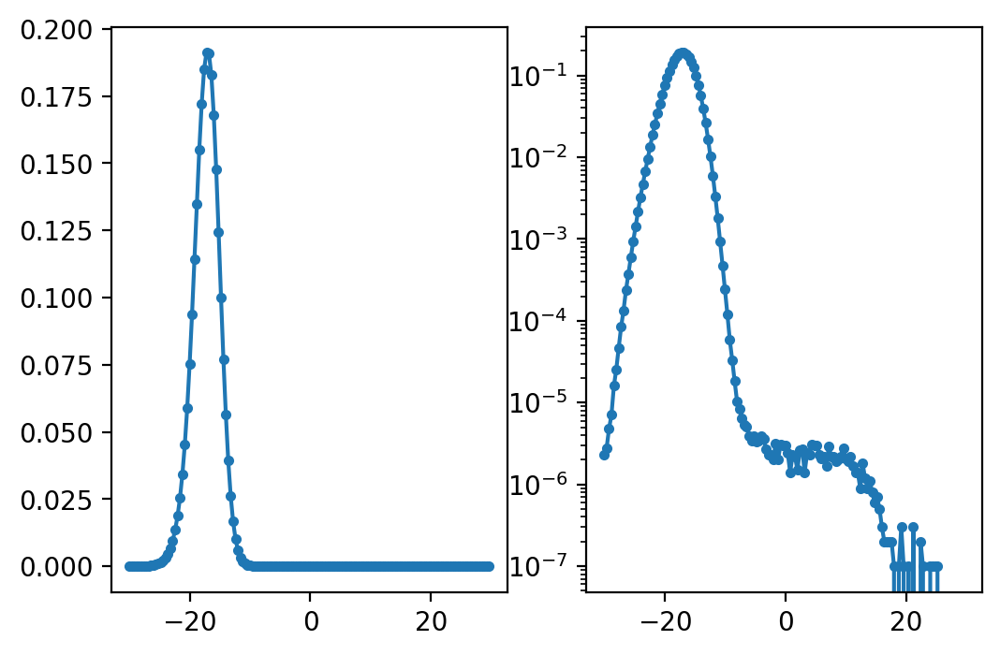

In [47]:
plt.figure(dpi = 200)

plt.subplot(121)
plt.plot(bin_edges[:-1], pdf, '.-')
plt.subplot(122)
plt.plot(bin_edges[:-1], pdf, '.-')
plt.yscale('log')

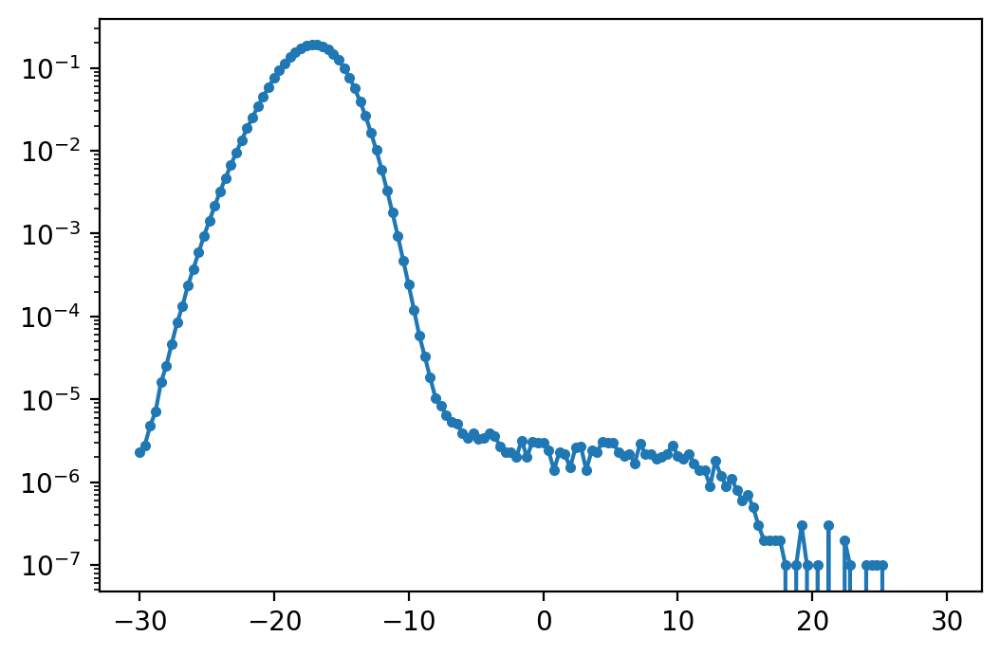

In [49]:
plt.figure(dpi = 200)
plt.plot(bin_edges[:-1], pdf, '.-')
plt.yscale('log')

In [112]:
thresh = -20

In [113]:
ix, iy = np.where(imarray > thresh)

In [115]:
ix, iy

(array([   0,    0,    0, ..., 4999, 4999, 4999]),
 array([   0,    1,    2, ..., 4997, 4998, 4999]))

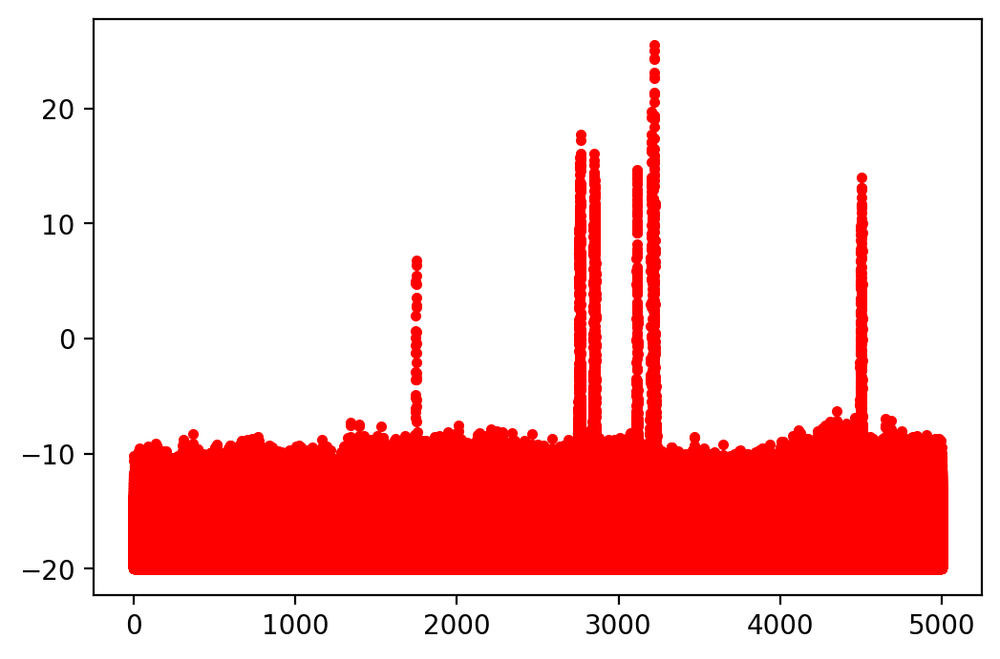

In [116]:
plt.figure(dpi = 200)
plt.plot(iy, imarray[ix, iy], 'r,')

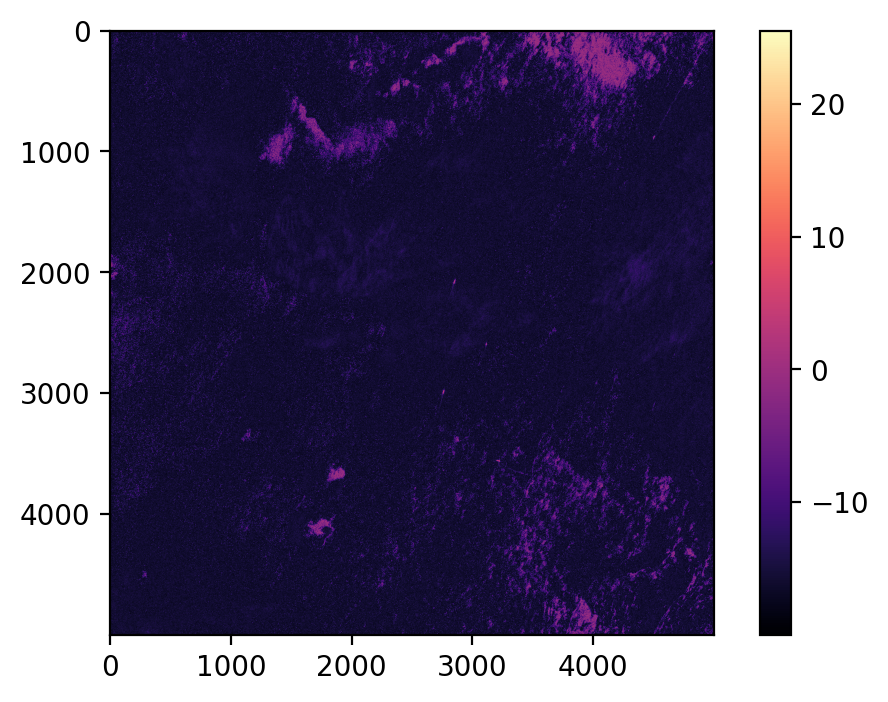

In [119]:
plt.figure(dpi = 200)
plt.imshow(imarray*(imarray > thresh), cmap = 'magma')
# plt.plot(iy, ix, 'r,')
plt.colorbar()
# plt.axis('off')

In [130]:
from skimage.transform import radon, rescale, iradon

In [131]:
from skimage.transform import radon, rescale, iradon

In [135]:
cmap = 'magma'

def Radon(image):

    theta = np.linspace(0., 180., max(image.shape), endpoint=False)
    sinogram = radon(image, theta=theta)
    dx, dy = 0.5 * 180.0 / max(image.shape), 0.5 / sinogram.shape[0]

    reconstruction_fbp = iradon(sinogram, theta=theta, filter_name='ramp')
    error = reconstruction_fbp - image

    fig = plt.figure(figsize=(20,5))   
    plt.subplot(141)
    im = plt.imshow(image, cmap)
    cbar = plt.colorbar(im, fraction=0.045, pad=0.02)
    plt.title('Image')

    plt.subplot(142)
    im2 = plt.imshow(sinogram, cmap=cmap,
               extent=(-dx, 180.0 + dx, -dy, sinogram.shape[0] + dy),
               aspect='auto')
    cbar2 = plt.colorbar(im2, fraction=0.045, pad=0.02)
    plt.title('Sinogram')

    plt.subplot(143)
    im3 = plt.imshow(reconstruction_fbp, cmap=cmap)#,
    cbar3 = plt.colorbar(im3, fraction=0.045, pad=0.02)
    plt.title('Reconstruction')


    plt.subplot(144)
    im4 = plt.imshow(error, cmap='Spectral')#,
    cbar4 = plt.colorbar(im4, fraction=0.045, pad=0.02)
    plt.title('Error')

In [196]:
img = imarray[0:1024, -1024:]
# plt.imshow(np.gradient(img[0,:,:]))

In [154]:
img = rescale(img, 0.5, anti_aliasing=False)

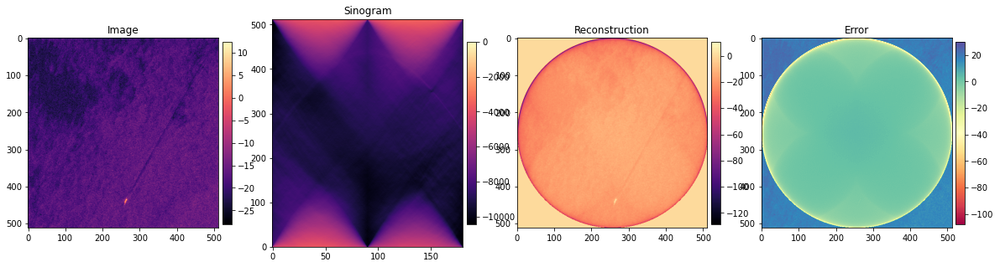

In [155]:
Radon(img)

## 

In [197]:
import cv2

# img = cv2.convertScaleAbs(imarray)
# img = imarray + np.abs(np.amin(imarray))
img = img + np.abs(np.amin(img))
img = 255*(img/img.max())
# edges = cv2.Canny(img,0,100)
# edges

In [198]:
img = np.uint8(img)

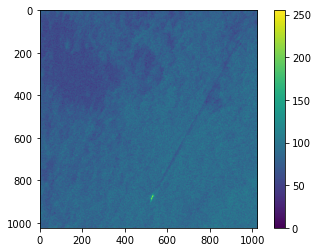

In [199]:
plt.imshow(img)
plt.colorbar()

  0%|                                                     | 0/5 [00:00<?, ?it/s]

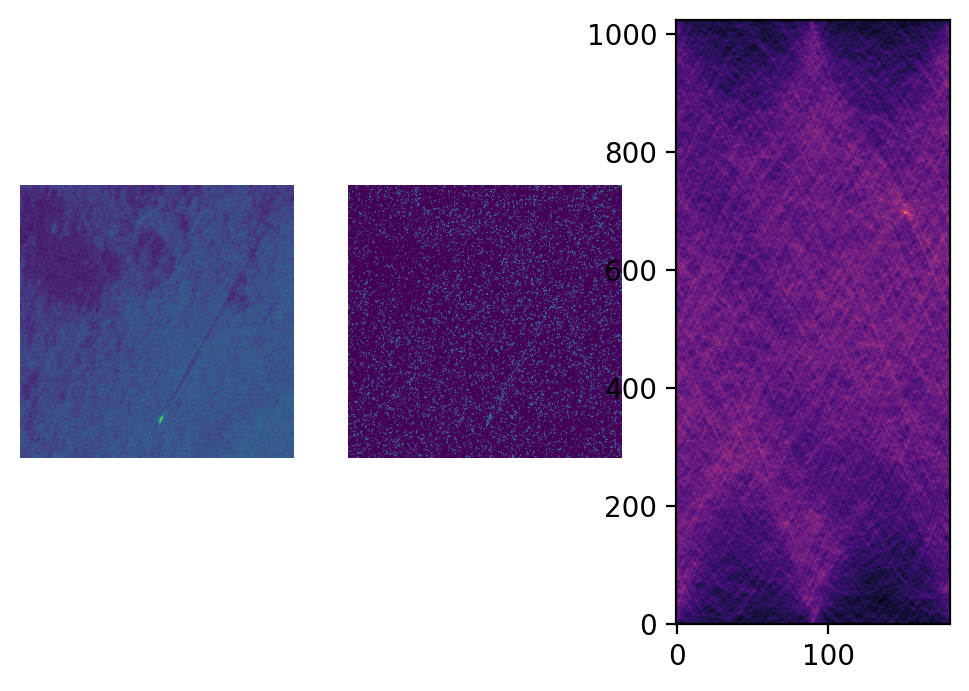

 20%|█████████                                    | 1/5 [00:20<01:20, 20.16s/it]

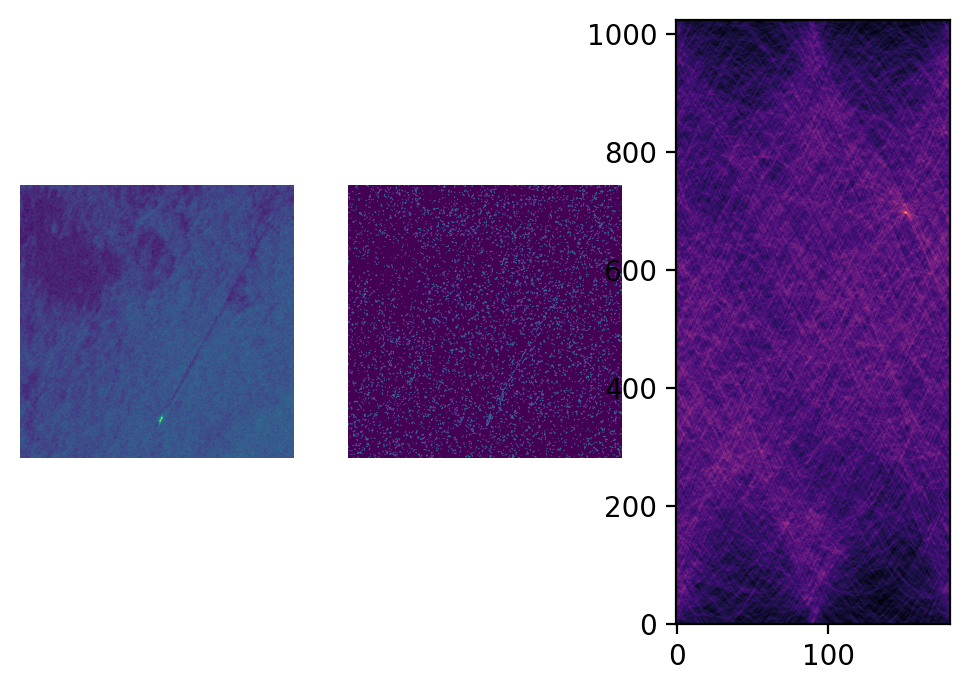

 40%|██████████████████                           | 2/5 [00:40<01:00, 20.03s/it]

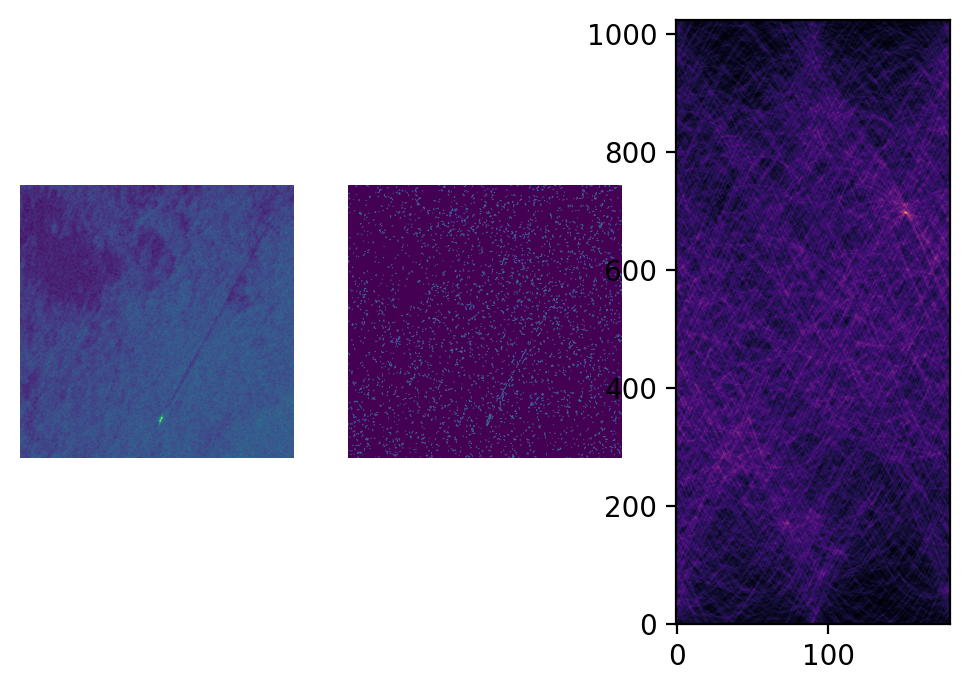

 60%|███████████████████████████                  | 3/5 [00:59<00:39, 19.96s/it]

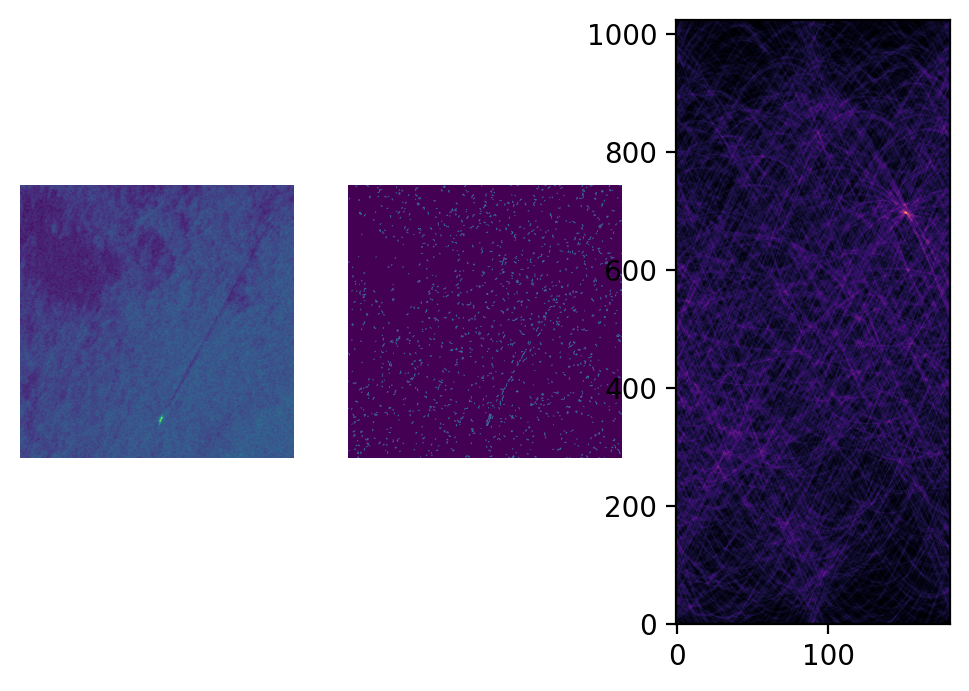

 80%|████████████████████████████████████         | 4/5 [01:19<00:19, 19.90s/it]

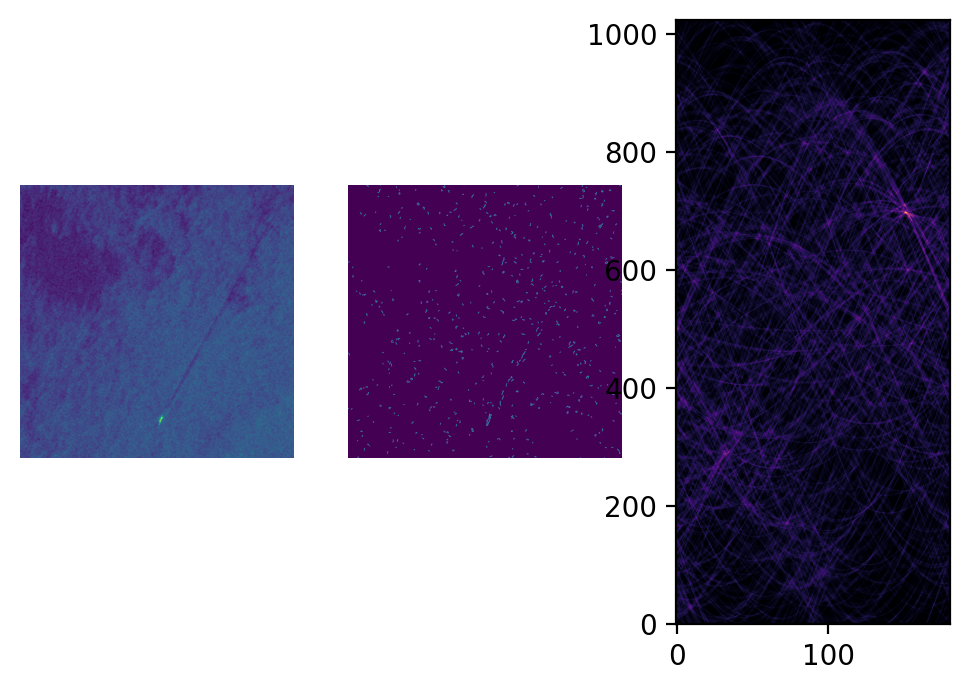

100%|█████████████████████████████████████████████| 5/5 [01:39<00:00, 19.95s/it]


In [213]:
for i in tqdm(range(5)):
    
#     img = np.abs(img)
#     img = 255*(img/img.max())
#     img = np.uint8(img)

    img = cv2.convertScaleAbs(img, alpha = 255.0 / np.amax(img))
    plt.figure(dpi = 200)
    plt.subplot(131)
    median = cv2.medianBlur(img, 5)
    plt.imshow(median)
    plt.axis('off')
    plt.subplot(132)
    edges = cv2.Canny(median,50,50+10*i)
    plt.imshow(edges)
    plt.axis('off')
    
    image = edges
    theta = np.linspace(0., 180., max(image.shape), endpoint=False)
    sinogram = radon(image, theta=theta)
    dx, dy = 0.5 * 180.0 / max(image.shape), 0.5 / sinogram.shape[0]
    
    plt.subplot(133)
    plt.imshow(sinogram, cmap=cmap,
               extent=(-dx, 180.0 + dx, -dy, sinogram.shape[0] + dy),
               aspect='auto')

    plt.show()
    

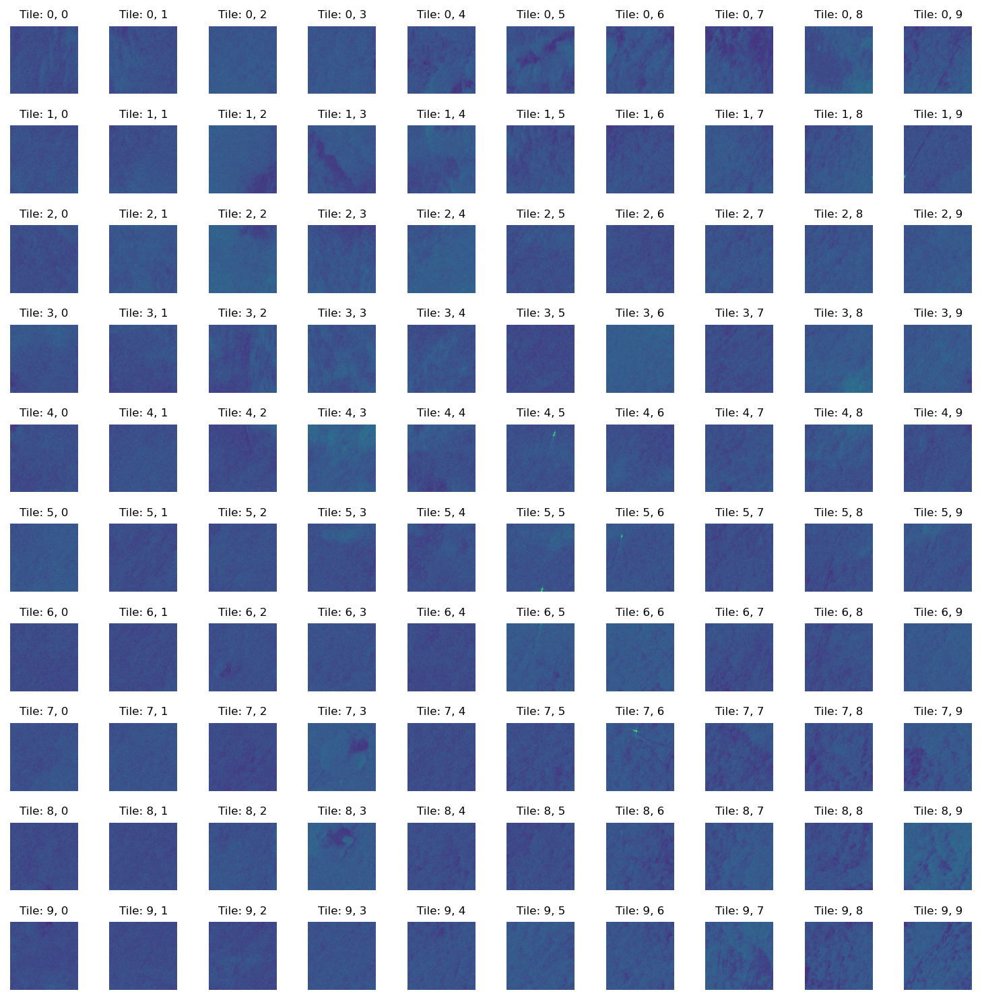

In [249]:
block_size = 500
windows = int(imarray.shape[0]/block_size)

plt.figure(dpi = 150, figsize = (10,10))
for i in range(windows):
    for j in range(windows):
        n = (i*10+j)+1
        plt.subplot(10,10,n)
        block = imarray[block_size*i:block_size*(i+1), block_size*j:block_size*(j+1)]
        plt.imshow(block, vmax = 15) 
        plt.title('Tile: ' +str(i) + ', ' + str(j), fontsize = 8)
        plt.axis('off')            
plt.tight_layout()

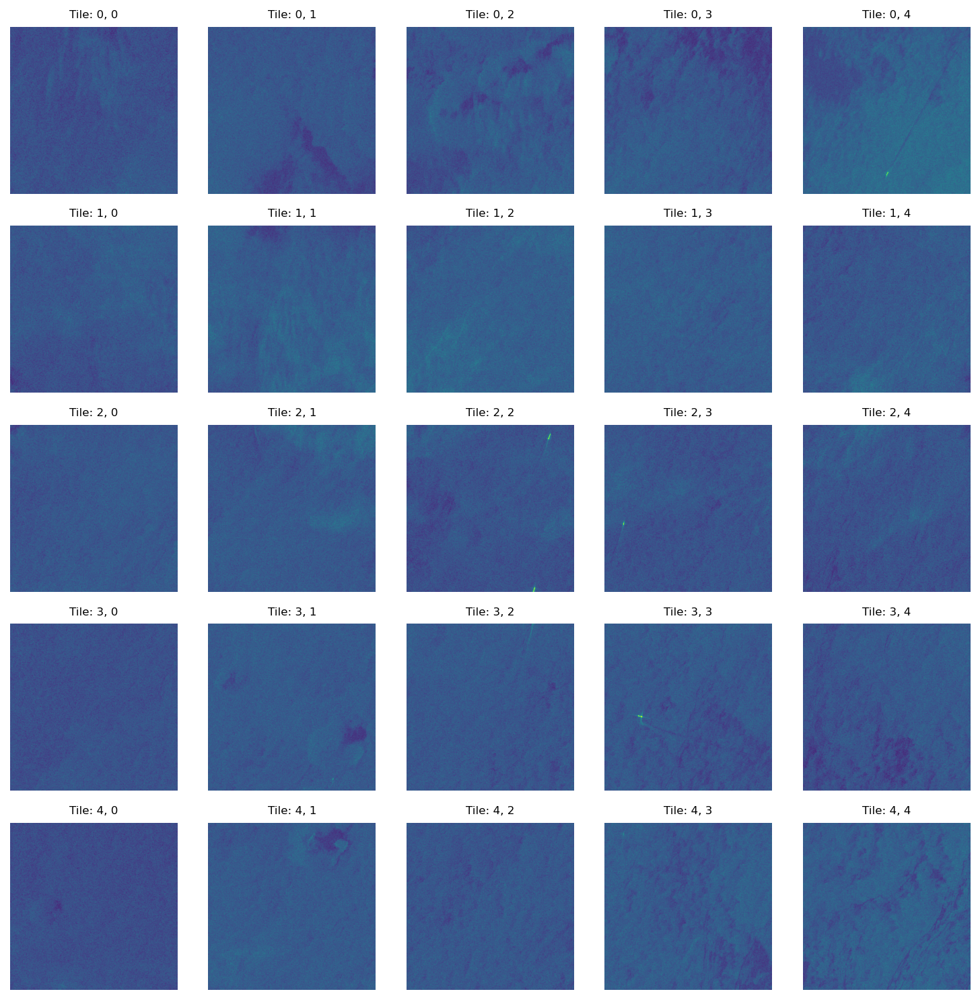

In [254]:
block_size = 1000
windows = int(imarray.shape[0]/block_size)

plt.figure(dpi = 150, figsize = (10,10))
for i in range(windows):
    for j in range(windows):
        n = (i*windows+j)+1
        plt.subplot(windows,windows,n)
        block = imarray[block_size*i:block_size*(i+1), block_size*j:block_size*(j+1)]
        plt.imshow(block, vmax = 15) 
        plt.title('Tile: ' +str(i) + ', ' + str(j), fontsize = 8)
        plt.axis('off')            
plt.tight_layout()

100%|███████████████████████████████████████████| 10/10 [00:01<00:00,  7.16it/s]


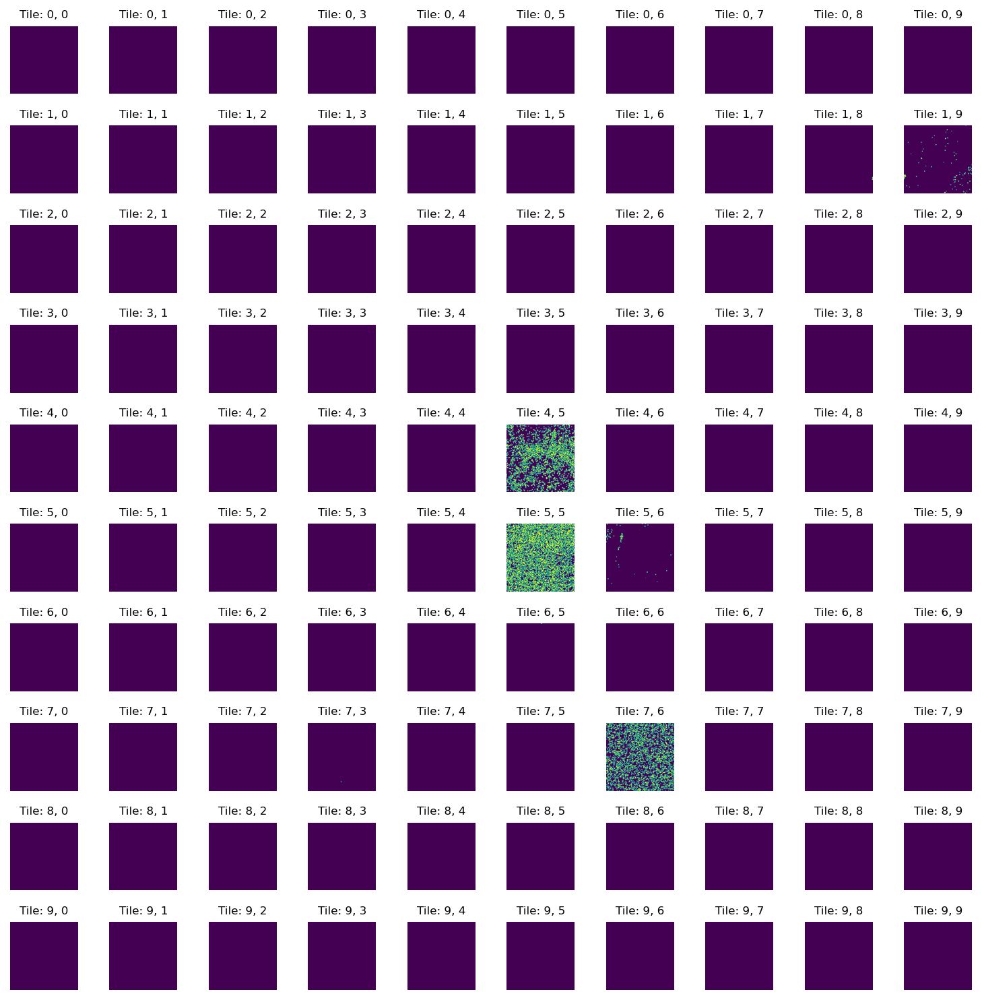

In [256]:
block_size = 500
windows = int(imarray.shape[0]/block_size)

plt.figure(dpi = 150, figsize = (10,10))
for i in tqdm(range(windows)):
    for j in range(windows):
        n = (i*windows+j)+1
        plt.subplot(windows,windows,n)
        plt.title('Tile: ' +str(i) + ', ' + str(j), fontsize = 8)

        block = imarray[block_size*i:block_size*(i+1), block_size*j:block_size*(j+1)]
        img = cv2.convertScaleAbs(block, alpha = 255.0 / np.amax(block))
        median = cv2.medianBlur(img, 5)
        edges = cv2.Canny(median, 50,100)
        plt.imshow(edges, vmax = 100)       
        plt.axis('off')            
plt.tight_layout()

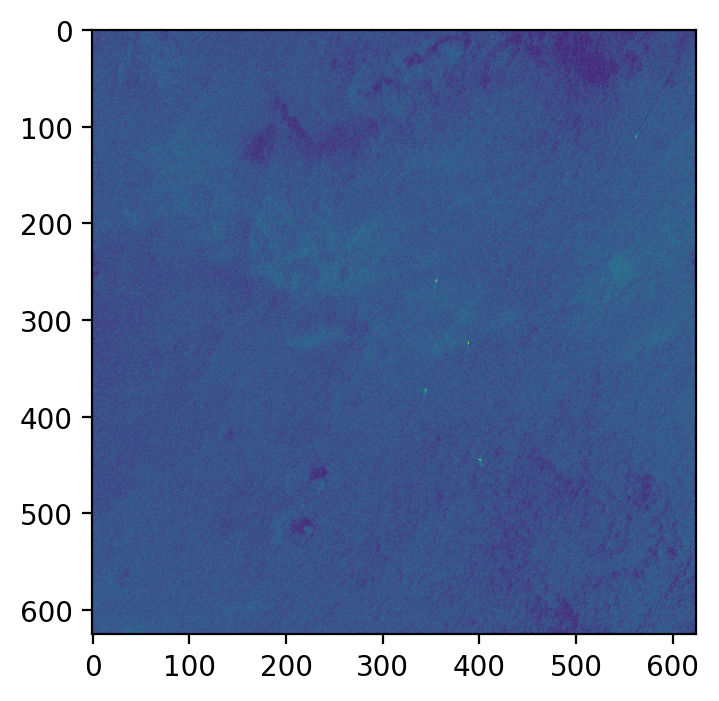

In [222]:
plt.figure(dpi = 200)
img = rescale(imarray, 0.125, anti_aliasing=False)
plt.imshow(img)

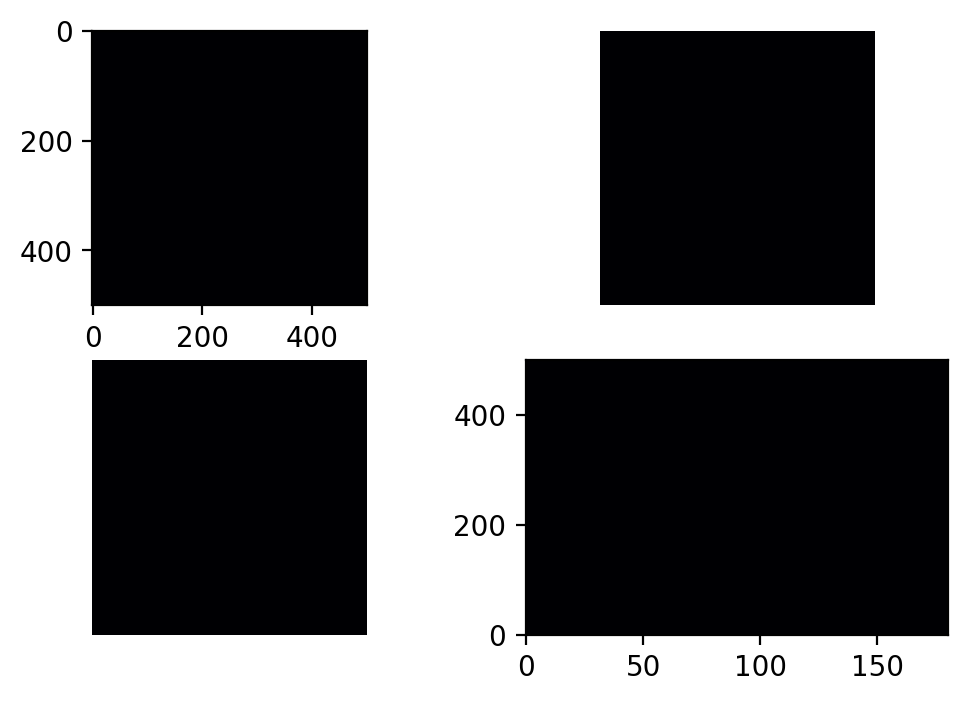

In [257]:
img = cv2.convertScaleAbs(img, alpha = 255.0 / np.amax(img))

plt.figure(dpi = 200)
plt.subplot(221)
plt.imshow(np.abs(img),  cmap = cmap)

plt.subplot(222)
median = cv2.medianBlur(img, 5)
plt.imshow(median, cmap = cmap)
plt.axis('off')
plt.subplot(223)
edges = cv2.Canny(median,50,100)
plt.imshow(edges , cmap = cmap)
plt.axis('off')
plt.axis('off')

image = edges
theta = np.linspace(0., 180., max(image.shape), endpoint=False)
sinogram = radon(image, theta=theta)
dx, dy = 0.5 * 180.0 / max(image.shape), 0.5 / sinogram.shape[0]

plt.subplot(224)
plt.imshow(sinogram, cmap=cmap,
           extent=(-dx, 180.0 + dx, -dy, sinogram.shape[0] + dy),
           aspect='auto')

plt.show()